
<div class="jumbotron m-0">
    <hr />
    <h1 class="text-center">
        <span class="text-primary">Deliverable 3 - Arrhythmia G6</span>
    </h1>
    <hr />
</div>

Bilal Ali, 
Christian Chávez, 
Xavier Pareras

1. [Explain the problem and highlight the targets of the project.](#1)
2. Draw boxplots of the data for each class and point out the outliers (if any) in the data using these graphs. 
3. Draw scatter plots of each feature against another features in the data set.
4. [Train two different classifiers with 80% data in the data set. Analyse and compare the performance of both classifiers using accuracy parameters and also, obtain the confusion matrix for each of the classifiers.](#4) 
5. [Using PCA, select the first three features with highest weightage from the data set. Then, use the new data set with selected features to train and test the same classifiers. Note the performance difference in comparison with the results obtained from task 3. ](#5)
6. [Now scale the variables the data set between 0 to 1. Again, train and test classifiers using the new scaled data and compare the performance with classifiers in task 3 and task 4. ](#6)
7. Deliberately delete 10% data points randomly in iris data set and replace with np.nan the deleted points. Then, impute data using simple median, most frequent across the column and constant value imputers. Train and Test classifiers with this data. Compare performances with the results obtained in tasks 3, 4, and 5.



<div>
    <h2 class="text-center">
        <span class="text-primary">1.</span>
        &nbsp;
        <span class="">Explain the problem and highlight the targets of the project</span>
    </h2>
</div><a name="1"></a>

 !!"Here Goes a definition of Arrythmia and the Dataset, Our objective is to  predict The class colum  which is the last one (column number 279 named 'Class', which is defined by integers up to 13)" !!


<div>
    <h3 class="text-center">
        <span class="text-primary"></span>
        &nbsp;
        <span class="">Introduction to the dataset Attributes</span>
    </h3>
</div>

7. Attribute Information:
   -- Complete attribute documentation:
      1 Age: Age in years , linear
      2 Sex: Sex (0 = male; 1 = female) , nominal
      3 Height: Height in centimeters , linear
      4 Weight: Weight in kilograms , linear
      5 QRS duration: Average of QRS duration in msec., linear
      6 P-R interval: Average duration between onset of P and Q waves
        in msec., linear
      7 Q-T interval: Average duration between onset of Q and offset
        of T waves in msec., linear
      8 T interval: Average duration of T wave in msec., linear
      9 P interval: Average duration of P wave in msec., linear
     Vector angles in degrees on front plane of:, linear
     10 QRS
     11 T
     12 P
     13 QRST
     14 J

     15 Heart rate: Number of heart beats per minute ,linear
    
     Of channel DI:
      Average width, in msec., of: linear
      16 Q wave
      17 R wave
      18 S wave
      19 R' wave, small peak just after R
      20 S' wave

      21 Number of intrinsic deflections, linear

      22 Existence of ragged R wave, nominal
      23 Existence of diphasic derivation of R wave, nominal
      24 Existence of ragged P wave, nominal
      25 Existence of diphasic derivation of P wave, nominal
      26 Existence of ragged T wave, nominal
      27 Existence of diphasic derivation of T wave, nominal

     Of channel DII: 
      28 .. 39 (similar to 16 .. 27 of channel DI)
     Of channels DIII:
      40 .. 51
     Of channel AVR:
      52 .. 63
     Of channel AVL:
      64 .. 75
     Of channel AVF:
      76 .. 87
     Of channel V1:
      88 .. 99
     Of channel V2:
      100 .. 111
     Of channel V3:
      112 .. 123
     Of channel V4:
      124 .. 135
     Of channel V5:
      136 .. 147
     Of channel V6:
      148 .. 159

     Of channel DI:
      Amplitude , * 0.1 milivolt, of
      160 JJ wave, linear
      161 Q wave, linear
      162 R wave, linear
      163 S wave, linear
      164 R' wave, linear
      165 S' wave, linear
      166 P wave, linear
      167 T wave, linear
      
      168 QRSA , Sum of areas of all segments divided by 10,
          ( Area= width * height / 2 ), linear
      169 QRSTA = QRSA + 0.5 * width of T wave * 0.1 * height of T
          wave. (If T is diphasic then the bigger segment is
          considered), linear

     Of channel DII:
      170 .. 179
     Of channel DIII:
      180 .. 189
     Of channel AVR:
      190 .. 199
     Of channel AVL:
      200 .. 209
     Of channel AVF:
      210 .. 219
     Of channel V1:
      220 .. 229
     Of channel V2:
      230 .. 239
     Of channel V3:
      240 .. 249
     Of channel V4:
      250 .. 259
     Of channel V5:
      260 .. 269
     Of channel V6:
      270 .. 279
      
8. Missing Attribute Values: Several.  Distinguished with '?'.

9. Class Distribution:
       Database:  Arrhythmia
       
       Class code :   Class   :                       Number of instances:
       01             Normal				          245
       02             Ischemic changes (Coronary Artery Disease)   44
       03             Old Anterior Myocardial Infarction           15
       04             Old Inferior Myocardial Infarction           15
       05             Sinus tachycardy			           13
       06             Sinus bradycardy			           25
       07             Ventricular Premature Contraction (PVC)       3
       08             Supraventricular Premature Contraction	    2
       09             Left bundle branch block 		            9	
       10             Right bundle branch block		           50
       11             1. degree AtrioVentricular block	            0	
       12             2. degree AV block		            0
       13             3. degree AV block		            0
       14             Left ventricule hypertrophy 	            4
       15             Atrial Fibrillation or Flutter	            5
       16             Others				           22


Firstly we import the libraries we need for this project

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import sklearn.decomposition as skn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix


We have uploaded the dataset to a Github repository for easier access and management

In [2]:
    df= pd.read_csv("https://raw.githubusercontent.com/xavi-pareras/Arrhythmia/main/Arrhythmia/arrhythmia.data", header= None )                

The Dataset is previewed below, names and descriptions for the column's data where extracted from the names file provided and shown previously in our introduction section

In [3]:
df

,0,1,2,3,4,5,6,7,8,9,...,270,271,272,273,274,275,276,277,278,279
0,75,0,190,80,91,193,371,174,121,-16,...,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56,1,165,64,81,174,401,149,39,25,...,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8,6
2,54,0,172,95,138,163,386,185,102,96,...,0.0,9.5,-2.4,0.0,0.0,0.3,3.4,12.3,49.0,10
3,55,0,175,94,100,202,380,179,143,28,...,0.0,12.2,-2.2,0.0,0.0,0.4,2.6,34.6,61.6,1
4,75,0,190,80,88,181,360,177,103,-16,...,0.0,13.1,-3.6,0.0,0.0,-0.1,3.9,25.4,62.8,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,53,1,160,70,80,199,382,154,117,-37,...,0.0,4.3,-5.0,0.0,0.0,0.7,0.6,-4.4,-0.5,1
448,37,0,190,85,100,137,361,201,73,86,...,0.0,15.6,-1.6,0.0,0.0,0.4,2.4,38.0,62.4,10
449,36,0,166,68,108,176,365,194,116,-85,...,0.0,16.3,-28.6,0.0,0.0,1.5,1.0,-44.2,-33.2,2
450,32,1,155,55,93,106,386,218,63,54,...,-0.4,12.0,-0.7,0.0,0.0,0.5,2.4,25.0,46.6,1


After Representing the answer variable in a barplot the distributuion od the dataset can be observed. The Majority of the sample correspond to class "1" meaning no arrythmia or disease. The overwhelming majority of this class means that it may be necessary to resample or downsample the dataset to improve perfomance should accuracy be too low. 

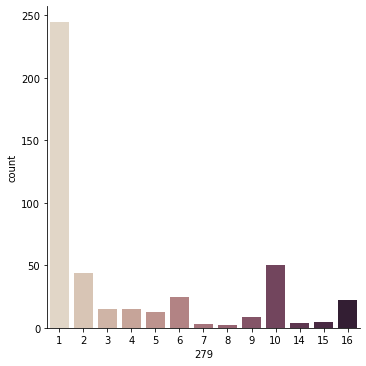

In [4]:
sns.catplot(x=279, kind="count", palette="ch:.25", data=df)

<div>
    <h2 class="text-center">
        <span class="text-primary">4.</span>
        &nbsp;
        <span class="">Train two different classifiers with 80% data in the data set. Analyse and compare the performance of both classifiers using accuracy parameters and also, obtain the confusion matrix for each of the classifiers</span>
    </h2>
</div><a name="4"></a>



<div>
    <h3 class="text-center">
        <span class="text-primary">4.1</span>
        &nbsp;
        <span class="">Data Preparation for Machine Learning</span>
    </h3>
</div>

<div>
    <h4 class="text-center">
        <span class="text-primary">4.1.1</span>
        &nbsp;
        <span class="">Conversion of Data Types</span>
    </h4>
</div>

The missing values for this dataset are in a string format wich does not match the rest of the column, in order to better treat these missing values we will replace them with n/a

In [5]:
df = df.replace('?', np.nan)

For easier procesing all datatypes will beconverted as a float

In [6]:
pd.set_option('display.max_rows', 300)

In [7]:
print(df.dtypes)

0        int64
1        int64
2        int64
3        int64
4        int64
5        int64
6        int64
7        int64
8        int64
9        int64
10      object
11      object
12      object
13      object
14      object
15       int64
16       int64
17       int64
18       int64
19       int64
20       int64
21       int64
22       int64
23       int64
24       int64
25       int64
26       int64
27       int64
28       int64
29       int64
30       int64
31       int64
32       int64
33       int64
34       int64
35       int64
36       int64
37       int64
38       int64
39       int64
40       int64
41       int64
42       int64
43       int64
44       int64
45       int64
46       int64
47       int64
48       int64
49       int64
50       int64
51       int64
52       int64
53       int64
54       int64
55       int64
56       int64
57       int64
58       int64
59       int64
60       int64
61       int64
62       int64
63       int64
64       int64
65       int64
66       i

In [8]:
df[df.columns[9:15]] = df[df.columns[9:15]].astype(float, errors = 'raise')

In [9]:
df[df.columns[0:9]] = df[df.columns[0:9]].astype(float, errors = 'raise')

In [10]:
df[df.columns[15:159]] = df[df.columns[15:159]].astype(float, errors = 'raise')

Finally we can leave column 279 as an integer because we will use it as an answer variable


<div>
    <h4 class="text-center">
        <span class="text-primary">4.1.2</span>
        &nbsp;
        <span class="">Treatment of missing values</span>
    </h4>
</div>

In order for prints and outputs to display the full results we apply pandas display option to 300 (the maximum number of columns) thus displaying all atributtes.

In [11]:
pd.set_option('display.max_rows', 300)

In [12]:
print(df.isna().sum())

0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       8
11      22
12       1
13     376
14       1
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
30       0
31       0
32       0
33       0
34       0
35       0
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       0
52       0
53       0
54       0
55       0
56       0
57       0
58       0
59       0
60       0
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

After evaluating the missing n/a we can see that columns 10 to 14 are the only ones showing missing values. specialy feature 13. They correspond to: 
    9. P interval
    10. QRS
    11. T
    12. P
    13. QRST
    14. J
We could eliminate the attributes completely, however we would lose valuable information. Dropin Rows with n/a values would't work as well since we would lose most of our dataframe. So in order to mantain the integrity of the data set we will fill them, except for column 13 in the data frame correspondent to the 14th attribute. We will drop the J interval due to having the majority of its data missing and the rest will be interpolated.  

In [13]:
df1 = df.drop(axis=1, columns=[13])

In [14]:
pd.set_option('display.max_columns', 300)


In [15]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279
0,75.0,0.0,190.0,80.0,91.0,193.0,371.0,174.0,121.0,-16.0,13.0,64.0,-2.0,NaN,63.0,0.0,52.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,36.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,40.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,36.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,32.0,0.0,0.0,0.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,52.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,52.0,0.0,0.0,36.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56.0,1.0,165.0,64.0,81.0,174.0,401.0,149.0,39.0,25.0,37.0,-17.0,31.0,NaN,53.0,0.0,48.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,24.0,0.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,52.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,52.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,40.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,7.2,0.0,0.0,0.0,0.4,1.5,17.2,26.5,0.0,0.0,5.5,0.0,0.0,0.0,0.1,1.7,17.6,29.5,0.3,-1.6,0.9,0.0,0.0,0.0,-0.3,0.4,-1.5,1.3,0.1,-6.4,0.0,0.0,0.0,0.0,-0.3,-1.6,-15.3,-25.5,-0.3,0.0,4.2,-0.9,0.0,0.0,0.4,0.7,8.3,12.3,0.2,0.0,2.2,0.0,0.0,0.0,-0.2,0.8,6.6,11.7,0.4,0.0,1.0,-8.8,0.0,0.0,0.5,-0.6,-21.6,-26.8,0.4,0.0,2.6,-7.9,0.0,0.0,0.8,2.0,-16.4,1.2,0.0,0.0,5.8,-7.7,0.0,0.0,0.9,3.8,-5.7,27.7,-0.2,0.0,9.5,-5.0,0.0,0.0,0.5,2.6,11.8,34.6,-0.4,0.0,11.0,-2.4,0.0,0.0,0.4,2.6,21.6,43.4,-0.5,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8,6
2,54.0,0.0,172.0,95.0,138.0,163.0,386.0,185.0,102.0,96.0,34.0,70.0,66.0,23.0,75.0,0.0,40.0,80.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,56.0,52.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,116.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,64.0,0.0,0.0,0.0,88.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,92.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,0.0,0.0,0.0,24.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,24.0,36.0,76.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,28.0,60.0,0.0,96.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,20.0,56.0,24.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0

After Droping column 13, we will have to fill the missing values for colums 10 up to 14
The Pad method of interpolate function will be used to fill the rest of n/a

In [16]:
df= df.interpolate(method="pad")

In [17]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279
0,75.0,0.0,190.0,80.0,91.0,193.0,371.0,174.0,121.0,-16.0,13.0,64.0,-2.0,NaN,63.0,0.0,52.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,36.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,40.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,36.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,32.0,0.0,0.0,0.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,52.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,52.0,0.0,0.0,36.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56.0,1.0,165.0,64.0,81.0,174.0,401.0,149.0,39.0,25.0,37.0,-17.0,31.0,NaN,53.0,0.0,48.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,24.0,0.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,52.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,52.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,40.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,7.2,0.0,0.0,0.0,0.4,1.5,17.2,26.5,0.0,0.0,5.5,0.0,0.0,0.0,0.1,1.7,17.6,29.5,0.3,-1.6,0.9,0.0,0.0,0.0,-0.3,0.4,-1.5,1.3,0.1,-6.4,0.0,0.0,0.0,0.0,-0.3,-1.6,-15.3,-25.5,-0.3,0.0,4.2,-0.9,0.0,0.0,0.4,0.7,8.3,12.3,0.2,0.0,2.2,0.0,0.0,0.0,-0.2,0.8,6.6,11.7,0.4,0.0,1.0,-8.8,0.0,0.0,0.5,-0.6,-21.6,-26.8,0.4,0.0,2.6,-7.9,0.0,0.0,0.8,2.0,-16.4,1.2,0.0,0.0,5.8,-7.7,0.0,0.0,0.9,3.8,-5.7,27.7,-0.2,0.0,9.5,-5.0,0.0,0.0,0.5,2.6,11.8,34.6,-0.4,0.0,11.0,-2.4,0.0,0.0,0.4,2.6,21.6,43.4,-0.5,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8,6
2,54.0,0.0,172.0,95.0,138.0,163.0,386.0,185.0,102.0,96.0,34.0,70.0,66.0,23.0,75.0,0.0,40.0,80.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,56.0,52.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,116.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,64.0,0.0,0.0,0.0,88.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,92.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,0.0,0.0,0.0,24.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,24.0,36.0,76.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,28.0,60.0,0.0,96.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,20.0,56.0,24.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [18]:
df = df.fillna(value= 23)

In [19]:
pd.set_option('display.max_rows', 500)

In [20]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279
0,75.0,0.0,190.0,80.0,91.0,193.0,371.0,174.0,121.0,-16.0,13.0,64.0,-2.0,23.0,63.0,0.0,52.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,36.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,40.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,36.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,32.0,0.0,0.0,0.0,56.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,52.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,52.0,0.0,0.0,36.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.2,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,13.6,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,-0.6,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,22.5,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,0.4,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,0.0,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,0.0,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4,8
1,56.0,1.0,165.0,64.0,81.0,174.0,401.0,149.0,39.0,25.0,37.0,-17.0,31.0,23.0,53.0,0.0,48.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,24.0,0.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,52.0,0.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,52.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,44.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,40.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,7.2,0.0,0.0,0.0,0.4,1.5,17.2,26.5,0.0,0.0,5.5,0.0,0.0,0.0,0.1,1.7,17.6,29.5,0.3,-1.6,0.9,0.0,0.0,0.0,-0.3,0.4,-1.5,1.3,0.1,-6.4,0.0,0.0,0.0,0.0,-0.3,-1.6,-15.3,-25.5,-0.3,0.0,4.2,-0.9,0.0,0.0,0.4,0.7,8.3,12.3,0.2,0.0,2.2,0.0,0.0,0.0,-0.2,0.8,6.6,11.7,0.4,0.0,1.0,-8.8,0.0,0.0,0.5,-0.6,-21.6,-26.8,0.4,0.0,2.6,-7.9,0.0,0.0,0.8,2.0,-16.4,1.2,0.0,0.0,5.8,-7.7,0.0,0.0,0.9,3.8,-5.7,27.7,-0.2,0.0,9.5,-5.0,0.0,0.0,0.5,2.6,11.8,34.6,-0.4,0.0,11.0,-2.4,0.0,0.0,0.4,2.6,21.6,43.4,-0.5,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8,6
2,54.0,0.0,172.0,95.0,138.0,163.0,386.0,185.0,102.0,96.0,34.0,70.0,66.0,23.0,75.0,0.0,40.0,80.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,56.0,52.0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,116.0,0.0,0.0,0.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,64.0,0.0,0.0,0.0,88.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,92.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,0.0,0.0,0.0,24.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,24.0,36.0,76.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,28.0,60.0,0.0,96.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,20.0,56.0,24.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0

There are no more Nan Values

In [21]:
print(df.isna().sum())

0      0
1      0
2      0
3      0
4      0
5      0
6      0
7      0
8      0
9      0
10     0
11     0
12     0
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22     0
23     0
24     0
25     0
26     0
27     0
28     0
29     0
30     0
31     0
32     0
33     0
34     0
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
110    0
1


<div>
    <h3 class="text-center">
        <span class="text-primary">4.2</span>
        &nbsp;
        <span class="">80/20 Train and Test Split</span>
    </h3>
</div>

In order to process our data for the predictive models we are going to need to have two diferent sets of data to train and subsequently test our algorithms accuracy

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
y = df[279]
X = df.drop([279],axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, random_state=5)

### 4.2.1 Creating a Dataframe to store accuracy results

In [24]:
columns =["Name","Score","Spesitivity","Sensitivity"]
df_comparison = pd.DataFrame( columns=columns)



<div>
    <h3 class="text-center">
        <span class="text-primary">4.3</span>
        &nbsp;
        <span class="">Support Vector Machine (SVM)</span>
    </h3>
</div>

Diferent SVM methods will be tested to find out the best kernell type for the accuracy

In [25]:
SVM = SVC(kernel='linear')
SVM.fit(X_train,y_train)

SVC(kernel='linear')

In [26]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train,y_train)


SVC(kernel='poly')

In [27]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train,y_train)


SVC()

In [28]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train,y_train)

SVC(kernel='sigmoid')


<div>
    <h4 class="text-center">
        <span class="text-primary">4.3.2</span>
        &nbsp;
        <span class="">Poly Kernel SVM testing</span>
    </h4>
</div>

In [29]:
y_train_pred = SVM2.predict(X_train)
y_test_pred = SVM2.predict(X_test)

In [30]:
score = str(accuracy_score(y_test, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.57
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 10
True Positives 	 1
Specifity: 100.0
Sensitivity: 9.090909090909092



<div>
    <h4 class="text-center">
        <span class="text-primary">4.3.3</span>
        &nbsp;
        <span class="">RBF Kernel SVM testing (default SVC Kernell)</span>
    </h4>
</div>

In [31]:
y_train_pred = SVM3.predict(X_train)
y_test_pred = SVM3.predict(X_test)

In [32]:
print("Accuracy Score RBF:", round(accuracy_score(y_test, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.55
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 10
True Positives 	 1
Specifity: 100.0
Sensitivity: 9.090909090909092



<div>
    <h4 class="text-center">
        <span class="text-primary">4.3.4</span>
        &nbsp;
        <span class="">Sigmoid Kernel SVM testing</span>
    </h4>
</div>

In [33]:
y_train_pred = SVM4.predict(X_train)
y_test_pred = SVM4.predict(X_test)

In [34]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.51
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h4 class="text-center">
        <span class="text-primary">4.3.5</span>
        &nbsp;
        <span class="">Linear Kernel SVM testing</span>
    </h4>
</div>

In [35]:
y_train_pred = SVM.predict(X_train)
y_test_pred = SVM.predict(X_test)

In [36]:
score = str(accuracy_score(y_test, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.63
Confusion matrix of SVM- Test
True Negatives 	 36
False Positives 	 2
False Negatives	 4
True Positives 	 6
Specifity: 94.73684210526315
Sensitivity: 60.0


The most accurate result is provided by a SVM algorithm using Linear Kernell



<div>
    <h3 class="text-center">
        <span class="text-primary">4.4</span>
        &nbsp;
        <span class="">Random Forest Classifier</span>
    </h3>
</div>



<div>
    <h4 class="text-center">
        <span class="text-primary">4.4.1.</span>
        &nbsp;
        <span class="">Random forest fiting</span>
    </h4>
</div>

In [37]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train, y_train)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h4 class="text-center">
        <span class="text-primary">4.4.2.</span>
        &nbsp;
        <span class="">Boosting</span>
    </h4>
</div>

A good practice when using a Random foret is Boosting, AdaBoost (which stands for adaptive boosting) is a popular machine learning algorithm for improving results. Essentially it tests the training data for accuracy and improves upon the mistakes made with the Data istances that have performed poorly. Essentially an improvement in the bagging method. 

In [38]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train, y_train)
y_train_pred = RF.predict(X_train)
y_test_pred = RF.predict(X_test)


<div>
    <h4 class="text-center">
        <span class="text-primary">4.4.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h4>
</div>

In [39]:
score = str(accuracy_score(y_test, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test, y_test_pred),2))

Accuracy Score: 0.74


In [40]:
score = str(accuracy_score(y_test, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.74
Confusion matrix of SVM- Test
True Negatives 	 44
False Positives 	 1
False Negatives	 2
True Positives 	 8
Specifity: 97.77777777777777
Sensitivity: 80.0




<div>
    <h2 class="text-center">
        <span class="text-primary">5.</span>
        &nbsp;
        <span class="">Using PCA, select the first three features with highest weightage from the data set. Then, use the new data set with selected features to train and test the same classifiers. Note the performance difference in comparison with the results obtained from task 3</span>
    </h2>
</div><a name="5"></a>


<div>
    <h3 class="text-center">
        <span class="text-primary">5.1</span>
        &nbsp;
        <span class="">Separating parameters from the answer variable</span>
    </h3>
</div>

In [41]:
y = df[279]
X = df.drop([279],axis=1)


In [42]:
from sklearn.decomposition import PCA 

In [43]:
pca = PCA(n_components = 3)

In [44]:
X_pca= pca.fit(X)

In [45]:
X_pca= pca.transform(X)

In [46]:
X_pca.shape

(452, 3)


<div>
    <h3 class="text-center">
        <span class="text-primary">5.2</span>
        &nbsp;
        <span class="">Train and test split</span>
    </h3>
</div>

In [47]:
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, train_size=0.80, random_state=5)


<div>
    <h3 class="text-center">
        <span class="text-primary">5.3</span>
        &nbsp;
        <span class="">SVM with PCA</span>
    </h3>
</div>

In [48]:
SVM = SVC(kernel='linear')
SVM.fit(X_train_pca,y_train_pca)

SVC(kernel='linear')

In [49]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train_pca,y_train_pca)


SVC(kernel='poly')

In [50]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train_pca,y_train_pca)


SVC()

In [51]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train_pca,y_train_pca)

SVC(kernel='sigmoid')


<div>
    <h4 class="text-center">
        <span class="text-primary">5.3.2.</span>
        &nbsp;
        <span class=""> Linear Kernel SVM testing</span>
    </h4>
</div>


In [52]:
y_train_pred = SVM.predict(X_train_pca)
y_test_pred = SVM.predict(X_test_pca)

In [53]:
score = str(accuracy_score(y_test_pca, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.53
Confusion matrix of SVM- Test
True Negatives 	 45
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h4 class="text-center">
        <span class="text-primary">5.3.3.</span>
        &nbsp;
        <span class=""> Poly Kernel SVM testing</span>
    </h4>
</div>

In [54]:
y_train_pred = SVM2.predict(X_train_pca)
y_test_pred = SVM2.predict(X_test_pca)

In [55]:
score = str(accuracy_score(y_test_pca, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.51
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h4 class="text-center">
        <span class="text-primary">5.3.4.</span>
        &nbsp;
        <span class=""> RBF Kernel SVM testing (default SVC Kernell)</span>
    </h4>
</div>

In [56]:
y_train_pred = SVM3.predict(X_train_pca)
y_test_pred = SVM3.predict(X_test_pca)

In [57]:
print("Accuracy Score RBF:", round(accuracy_score(y_test_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.52
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h4 class="text-center">
        <span class="text-primary">5.3.5.</span>
        &nbsp;
        <span class=""> Sigmoid Kernel SVM testing</span>
    </h4>
</div>

In [58]:
y_train_pred = SVM4.predict(X_train_pca)
y_test_pred = SVM4.predict(X_test_pca)

In [59]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.49
Confusion matrix of SVM- Test
True Negatives 	 45
False Positives 	 1
False Negatives	 11
True Positives 	 0
Specifity: 97.82608695652173
Sensitivity: 0.0


After applying Dimensionality reduction to our support vector machine algorithm the accuracy decreases a lot to arround 50% which is not much better than flipping a coin to decide its class.
it is important to keep in mind that principal component analysis doesnt work well without scaled data which can explain the loss in accuracy. 


<div>
    <h3 class="text-center">
        <span class="text-primary">5.4</span>
        &nbsp;
        <span class="">Random Forest with PCA </span>
    </h3>
</div>


<div>
    <h4 class="text-center">
        <span class="text-primary">5.4.1.</span>
        &nbsp;
        <span class=""> Random forest fiting</span>
    </h4>
</div>

In [60]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train_pca, y_train_pca)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h4 class="text-center">
        <span class="text-primary">5.4.2.</span>
        &nbsp;
        <span class=""> Boosting</span>
    </h4>
</div>

Again we use Boosting o improve the performance of Random forest algorithm

In [61]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train_pca, y_train_pca)
y_train_pred = RF.predict(X_train_pca)
y_test_pred = RF.predict(X_test_pca)


<div>
    <h4 class="text-center">
        <span class="text-primary">5.4.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h4>
</div>

In [62]:
score = str(accuracy_score(y_test_pca, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test_pca, y_test_pred),2))

Accuracy Score: 0.49


In [63]:
score = str(accuracy_score(y_test_pca, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.49
Confusion matrix of SVM- Test
True Negatives 	 43
False Positives 	 1
False Negatives	 8
True Positives 	 1
Specifity: 97.72727272727273
Sensitivity: 11.11111111111111


Again the accuracy drops, while performance is much faster than without using 


<div>
    <h2 class="text-center">
        <span class="text-primary">6.</span>
        &nbsp;
        <span class="">Now scale the variables the data set between 0 to 1. Again, train and test classifiers using the new scaled data and compare the performance with classifiers in task 3 and task 4.</span>
    </h2>
</div><a name="6"></a>


<div>
    <h3 class="text-center">
        <span class="text-primary">6.1</span>
        &nbsp;
        <span class="">Scaling data </span>
    </h3>
</div>

We will proceed to the corresponding scaling from the sklearn library where part of its preprocessing will give us a suitable method. In this case we will use the MinMaxScaler, which scales the values ​​of the variables in a range [0,1]

In [64]:
from sklearn.preprocessing import MinMaxScaler

we generate our object

In [65]:
MinMax = MinMaxScaler()

we continue to scale of the variables.

In [66]:
X_train_minmax = MinMax.fit_transform(X_train)
X_test_minmax = MinMax.fit_transform(X_test)
y_train_minmax = (y_train)
y_test_minmax = (y_test)

Let's see how our data escalation is..

In [67]:
X_train_minmax

array([[0.48148148, 1.        , 0.10934394, ..., 0.65833333, 0.53233083,
        0.51779935],
       [0.90123457, 0.        , 0.11928429, ..., 0.54166667, 0.46917293,
        0.39482201],
       [0.        , 0.        , 1.        , ..., 0.70833333, 0.24360902,
        0.26084142],
       ...,
       [0.81481481, 1.        , 0.10139165, ..., 0.41666667, 0.51278195,
        0.32750809],
       [0.65432099, 0.        , 0.14512922, ..., 0.69166667, 0.38947368,
        0.41812298],
       [0.58024691, 0.        , 0.13916501, ..., 0.575     , 0.49323308,
        0.44530744]])

In [68]:
X_test_minmax

array([[0.80487805, 1.        , 0.05053599, ..., 0.7       , 0.67768595,
        0.61117078],
       [0.51219512, 1.        , 0.04594181, ..., 0.68333333, 0.70956316,
        0.60687433],
       [0.5       , 1.        , 0.05819296, ..., 0.65      , 0.55726092,
        0.47905478],
       ...,
       [1.        , 1.        , 0.05053599, ..., 0.86666667, 0.71546635,
        0.783029  ],
       [0.19512195, 1.        , 0.05053599, ..., 0.58333333, 0.55489965,
        0.41353383],
       [0.70731707, 0.        , 0.0719755 , ..., 0.45      , 0.47343566,
        0.32975295]])

As you can see, all the data shown is in the requested range, so let's continue


<div>
    <h3 class="text-center">
        <span class="text-primary">6.2</span>
        &nbsp;
        <span class="">Support Vector Machine (SVM)</span>
    </h3>
</div>

Diferent SVM methods will be tested to find out the best kernell type for the accuracy

In [69]:
SVM = SVC(kernel='linear')
SVM.fit(X_train_minmax,y_train_minmax)

SVC(kernel='linear')

In [70]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train_minmax,y_train_minmax)


SVC(kernel='poly')

In [71]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train_minmax,y_train_minmax)


SVC()

In [72]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train_minmax,y_train_minmax)

SVC(kernel='sigmoid')


<div>
    <h4 class="text-center">
        <span class="text-primary">6.2.1</span>
        &nbsp;
        <span class="">Poly Kernel SVM testing</span>
    </h4>
</div>

In [73]:
y_train_pred = SVM2.predict(X_train_minmax)
y_test_pred = SVM2.predict(X_test_minmax)

In [74]:
score = str(accuracy_score(y_test_minmax, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_minmax, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.4
Confusion matrix of SVM- Test
True Negatives 	 16
False Positives 	 30
False Negatives	 0
True Positives 	 11
Specifity: 34.78260869565217
Sensitivity: 100.0



<div>
    <h4 class="text-center">
        <span class="text-primary">6.2.2</span>
        &nbsp;
        <span class="">RBF Kernel SVM testing (default SVC Kernell)</span>
    </h4>
</div>

In [75]:
y_train_pred = SVM3.predict(X_train_minmax)
y_test_pred = SVM3.predict(X_test_minmax)

In [76]:
print("Accuracy Score RBF:", round(accuracy_score(y_test_minmax, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.59
Confusion matrix of SVM- Test
True Negatives 	 44
False Positives 	 0
False Negatives	 7
True Positives 	 4
Specifity: 100.0
Sensitivity: 36.36363636363637



<div>
    <h4 class="text-center">
        <span class="text-primary">6.2.3</span>
        &nbsp;
        <span class="">Sigmoid Kernel SVM testing</span>
    </h4>
</div>

In [77]:
y_train_pred = SVM4.predict(X_train_minmax)
y_test_pred = SVM4.predict(X_test_minmax)

In [78]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test_minmax, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.51
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h4 class="text-center">
        <span class="text-primary">6.2.4</span>
        &nbsp;
        <span class="">Linear Kernel SVM testing</span>
    </h4>
</div>

In [79]:
y_train_pred = SVM.predict(X_train_minmax)
y_test_pred = SVM.predict(X_test_minmax)

In [80]:
score = str(accuracy_score(y_test_minmax, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_minmax, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.4
Confusion matrix of SVM- Test
True Negatives 	 16
False Positives 	 14
False Negatives	 0
True Positives 	 9
Specifity: 53.333333333333336
Sensitivity: 100.0


The most accurate result is provided by a SVM algorithm using Linear Kernell



<div>
    <h3 class="text-center">
        <span class="text-primary">6.3</span>
        &nbsp;
        <span class="">Random Forest Classifier</span>
    </h3>
</div>



<div>
    <h4 class="text-center">
        <span class="text-primary">6.3.1.</span>
        &nbsp;
        <span class="">Random forest fiting</span>
    </h4>
</div>

In [81]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train_minmax, y_train_minmax)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h4 class="text-center">
        <span class="text-primary">6.3.2.</span>
        &nbsp;
        <span class="">Boosting</span>
    </h4>
</div>

A good practice when using a Random foret is Boosting, AdaBoost (which stands for adaptive boosting) is a popular machine learning algorithm for improving results. Essentially it tests the training data for accuracy and improves upon the mistakes made with the Data istances that have performed poorly. Essentially an improvement in the bagging method. 

In [82]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train_minmax, y_train_minmax)
y_train_pred = RF.predict(X_train_minmax)
y_test_pred = RF.predict(X_test_minmax)


<div>
    <h4 class="text-center">
        <span class="text-primary">6.3.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h4>
</div>

In [83]:
score = str(accuracy_score(y_test_minmax, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test_minmax, y_test_pred),2))

Accuracy Score: 0.47


In [84]:
score = str(accuracy_score(y_test_minmax, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test_minmax, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.47
Confusion matrix of SVM- Test
True Negatives 	 21
False Positives 	 6
False Negatives	 0
True Positives 	 8
Specifity: 77.77777777777779
Sensitivity: 100.0


<div>
    <h3 class="text-center">
        <span class="text-primary">6.4</span>
        &nbsp;
        <span class="">Using PCA</span>
    </h3>
</div>


<div>
    <h4 class="text-center">
        <span class="text-primary">6.4.1</span>
        &nbsp;
        <span class="">Scaling Data</span>
    </h4>
</div>

In [85]:
X_train_minmax_pca = MinMax.fit_transform(X_train_pca)
X_test_minmax_pca = MinMax.fit_transform(X_test_pca)
y_train_minmax_pca = (y_train_pca)
y_test_minmax_pca = (y_test_pca)


<div>
    <h4 class="text-center">
        <span class="text-primary">6.4.2</span>
        &nbsp;
        <span class="">SVM with PCA</span>
    </h4>
</div>

In [86]:
SVM = SVC(kernel='linear')
SVM.fit(X_train_minmax_pca,y_train_minmax_pca)

SVC(kernel='linear')

In [87]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train_minmax_pca,y_train_minmax_pca)


SVC(kernel='poly')

In [88]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train_minmax_pca,y_train_minmax_pca)


SVC()

In [89]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train_minmax_pca,y_train_minmax_pca)

SVC(kernel='sigmoid')


<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.2.2</span>
        &nbsp;
        <span class=""> Linear Kernel SVM testing</span>
    </h5>
</div>


In [90]:
y_train_pred = SVM.predict(X_train_minmax_pca)
y_test_pred = SVM.predict(X_test_minmax_pca)

In [91]:
score = str(accuracy_score(y_test_minmax_pca, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.52
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.2.3.</span>
        &nbsp;
        <span class=""> Poly Kernel SVM testing</span>
    </h5>
</div>

In [92]:
y_train_pred = SVM2.predict(X_train_minmax_pca)
y_test_pred = SVM2.predict(X_test_minmax_pca)

In [93]:
score = str(accuracy_score(y_test_minmax_pca, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.38
Confusion matrix of SVM- Test
True Negatives 	 33
False Positives 	 2
False Negatives	 3
True Positives 	 1
Specifity: 94.28571428571428
Sensitivity: 25.0



<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.2.4.</span>
        &nbsp;
        <span class=""> RBF Kernel SVM testing (default SVC Kernell)</span>
    </h5>
</div>

In [94]:
y_train_pred = SVM3.predict(X_train_minmax_pca)
y_test_pred = SVM3.predict(X_test_minmax_pca)

In [95]:
print("Accuracy Score RBF:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.44
Confusion matrix of SVM- Test
True Negatives 	 40
False Positives 	 2
False Negatives	 7
True Positives 	 0
Specifity: 95.23809523809523
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.2.5. </span>
        &nbsp;
        <span class=""> Sigmoid Kernel SVM testing</span>
    </h5>
</div>

In [96]:
y_train_pred = SVM4.predict(X_train_minmax_pca)
y_test_pred = SVM4.predict(X_test_minmax_pca)

In [97]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.51
Confusion matrix of SVM- Test
True Negatives 	 46
False Positives 	 0
False Negatives	 11
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0


After applying Dimensionality reduction to our support vector machine algorithm the accuracy decreases a lot to arround 50% which is not much better than flipping a coin to decide its class.
it is important to keep in mind that principal component analysis doesnt work well without scaled data which can explain the loss in accuracy. 


<div>
    <h4 class="text-center">
        <span class="text-primary">6.4.3</span>
        &nbsp;
        <span class="">Random Forest with PCA </span>
    </h4>
</div>


<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.3.1.</span>
        &nbsp;
        <span class=""> Random forest fiting</span>
    </h5>
</div>

In [98]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train_minmax_pca, y_train_minmax_pca)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.3.2.</span>
        &nbsp;
        <span class=""> Boosting</span>
    </h5>
</div>

Again we use Boosting o improve the performance of Random forest algorithm

In [99]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train_minmax_pca, y_train_minmax_pca)
y_train_pred = RF.predict(X_train_minmax_pca)
y_test_pred = RF.predict(X_test_minmax_pca)


<div>
    <h5 class="text-center">
        <span class="text-primary">6.4.3.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h5>
</div>

In [100]:
score = str(accuracy_score(y_test_minmax_pca, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))

Accuracy Score: 0.24


In [101]:
score = str(accuracy_score(y_test_pca, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test_minmax_pca, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test_minmax_pca, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.24
Confusion matrix of SVM- Test
True Negatives 	 16
False Positives 	 14
False Negatives	 0
True Positives 	 5
Specifity: 53.333333333333336
Sensitivity: 100.0


Again the accuracy drops, while performance is much faster than without using 

<div>
    <h2 class="text-center">
        <span class="text-primary">7.</span>
        &nbsp;
        <span class="">Deliberately delete 10% data points randomly in iris data set and replace with np.nan the deleted points. Then, impute data using simple median, most frequent across the column and constant value imputers. Train and Test classifiers with this data. Compare performances with the results obtained in tasks 3, 4, and 5.</span>
    </h2>
</div><a name="7"></a>

<div>
    <h3 class="text-center">
        <span class="text-primary">7.1</span>
        &nbsp;
        <span class="">Deleting 10% data</span>
    </h3>
</div>

We will create a function using sample method, in this way we will delete 10% of the data randomly.

In [102]:
def delete_10(col):
    col.loc[col.sample(frac=0.1).index] = np.nan
    return col



We apply it only to our inputs and we verify that the deletion has been carried out correctly

In [103]:
X.apply(delete_10, axis=0)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278
0,75.0,0.0,190.0,80.0,91.0,193.0,371.0,174.0,121.0,-16.0,13.0,64.0,-2.0,NaN,63.0,0.0,52.0,44.0,0.0,0.0,32.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,36.0,0.0,28.0,0.0,0.0,NaN,0.0,0.0,0.0,52.0,NaN,0.0,0.0,0.0,60.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,56.0,36.0,0.0,0.0,32.0,0.0,0.0,0.0,NaN,NaN,0.0,48.0,32.0,0.0,0.0,0.0,56.0,0.0,NaN,NaN,0.0,NaN,0.0,80.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,40.0,52.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,48.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,52.0,52.0,0.0,0.0,36.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,52.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,56.0,44.0,0.0,NaN,32.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,6.1,-1.0,0.0,0.0,0.6,2.1,NaN,30.8,0.0,0.0,1.7,-1.0,0.6,0.0,1.3,1.5,3.7,14.5,0.1,-5.2,1.4,0.0,0.0,0.0,0.8,NaN,-10.7,-15.6,0.4,-3.9,0.0,0.0,0.0,0.0,-0.8,-1.7,-10.1,-22.0,0.0,0.0,5.7,-1.0,0.0,0.0,-0.1,1.2,14.1,NaN,0.0,-2.5,0.8,0.0,0.0,0.0,1.0,NaN,-4.8,-2.7,0.1,-6.0,0.0,0.0,0.0,0.0,-0.8,-0.6,-24.0,-29.7,0.0,0.0,2.0,-6.4,0.0,0.0,0.2,2.9,-12.6,15.2,-0.1,0.0,8.4,-10.0,0.0,0.0,0.6,5.9,-3.9,52.7,-0.3,0.0,15.2,-8.4,NaN,0.0,0.9,5.1,17.7,70.7,-0.4,0.0,13.5,-4.0,0.0,NaN,0.9,3.9,25.5,62.9,-0.3,0.0,9.0,-0.9,0.0,0.0,0.9,2.9,23.3,49.4
1,56.0,1.0,NaN,64.0,NaN,174.0,401.0,149.0,39.0,25.0,37.0,NaN,31.0,23.0,NaN,0.0,48.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,64.0,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,NaN,0.0,32.0,24.0,0.0,NaN,0.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,48.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,20.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0,0.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,52.0,0.0,0.0,16.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,32.0,52.0,0.0,0.0,20.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,44.0,48.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,44.0,0.0,NaN,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,48.0,40.0,0.0,0.0,28.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,48.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.6,0.0,7.2,0.0,0.0,NaN,0.4,NaN,17.2,26.5,0.0,0.0,5.5,0.0,0.0,0.0,0.1,1.7,NaN,29.5,NaN,-1.6,0.9,0.0,0.0,0.0,-0.3,0.4,-1.5,1.3,0.1,NaN,0.0,0.0,0.0,0.0,-0.3,NaN,-15.3,-25.5,-0.3,0.0,4.2,-0.9,0.0,0.0,0.4,0.7,8.3,12.3,0.2,0.0,2.2,0.0,0.0,0.0,-0.2,0.8,6.6,11.7,0.4,0.0,1.0,-8.8,0.0,NaN,0.5,-0.6,-21.6,-26.8,0.4,0.0,2.6,-7.9,0.0,0.0,0.8,2.0,-16.4,1.2,0.0,0.0,5.8,NaN,0.0,0.0,0.9,NaN,-5.7,27.7,-0.2,0.0,9.5,NaN,0.0,0.0,0.5,2.6,11.8,34.6,-0.4,0.0,11.0,-2.4,0.0,0.0,0.4,2.6,21.6,43.4,-0.5,0.0,8.5,0.0,0.0,0.0,0.2,2.1,20.4,38.8
2,54.0,0.0,NaN,95.0,138.0,NaN,386.0,185.0,102.0,96.0,34.0,NaN,66.0,23.0,75.0,0.0,40.0,80.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,56.0,52.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,28.0,116.0,NaN,0.0,0.0,52.0,NaN,0.0,0.0,NaN,0.0,0.0,52.0,64.0,0.0,NaN,0.0,88.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,NaN,0.0,0.0,24.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,128.0,0.0,NaN,0.0,24.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,24.0,36.0,76.0,0.0,100.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,40.0,NaN,60.0,NaN,96.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,48.0,20.0,56.0,24.0,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,88.0,0.0,0.0,28.0,NaN,0.0,0

With the following command we can see that 10% of each column has been deleted randomly

In [104]:
X.isnull().sum() / len(X)

0      0.099558
1      0.099558
2      0.099558
3      0.099558
4      0.099558
5      0.099558
6      0.099558
7      0.099558
8      0.099558
9      0.099558
10     0.099558
11     0.099558
12     0.099558
13     0.099558
14     0.099558
15     0.099558
16     0.099558
17     0.099558
18     0.099558
19     0.099558
20     0.099558
21     0.099558
22     0.099558
23     0.099558
24     0.099558
25     0.099558
26     0.099558
27     0.099558
28     0.099558
29     0.099558
30     0.099558
31     0.099558
32     0.099558
33     0.099558
34     0.099558
35     0.099558
36     0.099558
37     0.099558
38     0.099558
39     0.099558
40     0.099558
41     0.099558
42     0.099558
43     0.099558
44     0.099558
45     0.099558
46     0.099558
47     0.099558
48     0.099558
49     0.099558
50     0.099558
51     0.099558
52     0.099558
53     0.099558
54     0.099558
55     0.099558
56     0.099558
57     0.099558
58     0.099558
59     0.099558
60     0.099558
61     0.099558
62     0

<div>
    <h3 class="text-center">
        <span class="text-primary">7.2</span>
        &nbsp;
        <span class="">impute data using simple median</span>
    </h3>
</div>

To use the data of the median or the most frequent value, we will use the sklearn library, SimpleImputer

In [105]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
imputer.fit(X)
X_median = imputer.transform(X)


In [106]:
X_median

array([[ 75. ,   0. , 190. , ...,   2.9,  23.3,  49.4],
       [ 56. ,   1. , 165. , ...,   2.1,  20.4,  38.8],
       [ 54. ,   0. , 165. , ...,   3.4,  12.3,  27.7],
       ...,
       [ 47. ,   0. , 166. , ...,   1. , -44.2, -33.2],
       [ 32. ,   1. , 155. , ...,   2.4,  25. ,  46.6],
       [ 78. ,   1. , 160. , ...,   1.6,  21.3,  32.8]])

In [107]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_median, y, test_size = 0.2, random_state = 1)

<div>
    <h4 class="text-center">
        <span class="text-primary">7.2.1</span>
        &nbsp;
        <span class="">Support Vector Machine (SVM)</span>
    </h4>
</div>


Diferent SVM methods will be tested to find out the best kernell type for the accuracy

In [108]:
SVM = SVC(kernel='linear')
SVM.fit(X_train2,y_train2)

SVC(kernel='linear')

In [109]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train2,y_train2)


SVC(kernel='poly')

In [110]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train2,y_train2)


SVC()

In [111]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train2,y_train2)

SVC(kernel='sigmoid')


<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.1.1</span>
        &nbsp;
        <span class="">Poly Kernel SVM testing</span>
    </h5>
</div>

In [112]:
y_train_pred = SVM2.predict(X_train2)
y_test_pred = SVM2.predict(X_test2)

In [113]:
score = str(accuracy_score(y_test2, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test2, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test2, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.67
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 4
True Positives 	 4
Specifity: 100.0
Sensitivity: 50.0



<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.1.2</span>
        &nbsp;
        <span class="">RBF Kernel SVM testing (default SVC Kernell)</span>
    </h5>
</div>

In [114]:
y_train_pred = SVM3.predict(X_train2)
y_test_pred = SVM3.predict(X_test2)

In [115]:
print("Accuracy Score RBF:", round(accuracy_score(y_test2, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test2, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.62
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 8
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.1.3</span>
        &nbsp;
        <span class="">Sigmoid Kernel SVM testing</span>
    </h5>
</div>

In [116]:
y_train_pred = SVM4.predict(X_train2)
y_test_pred = SVM4.predict(X_test2)

In [117]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test2, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test2, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.57
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 8
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.1.4</span>
        &nbsp;
        <span class="">Linear Kernel SVM testing</span>
    </h5>
</div>

In [118]:
y_train_pred = SVM.predict(X_train2)
y_test_pred = SVM.predict(X_test2)

In [119]:
score = str(accuracy_score(y_test2, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test2, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test2, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.68
Confusion matrix of SVM- Test
True Negatives 	 42
False Positives 	 2
False Negatives	 3
True Positives 	 4
Specifity: 95.45454545454545
Sensitivity: 57.14285714285714


The most accurate result is provided by a SVM algorithm using Linear Kernell



<div>
    <h4 class="text-center">
        <span class="text-primary">7.2.2</span>
        &nbsp;
        <span class="">Random Forest Classifier</span>
    </h4>
</div>



<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.2.1.</span>
        &nbsp;
        <span class="">Random forest fiting</span>
    </h5>
</div>

In [120]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train2, y_train2)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.2.1.2</span>
        &nbsp;
        <span class="">Boosting</span>
    </h5>
</div>

A good practice when using a Random foret is Boosting, AdaBoost (which stands for adaptive boosting) is a popular machine learning algorithm for improving results. Essentially it tests the training data for accuracy and improves upon the mistakes made with the Data istances that have performed poorly. Essentially an improvement in the bagging method. 

In [121]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train2, y_train2)
y_train_pred = RF.predict(X_train2)
y_test_pred = RF.predict(X_test2)


<div>
    <h5 class="text-center">
        <span class="text-primary">7.2.2.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h5>
</div>

In [122]:
score = str(accuracy_score(y_test2, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test2, y_test_pred),2))

Accuracy Score: 0.76


In [123]:
score = str(accuracy_score(y_test2, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test2, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test2, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.76
Confusion matrix of SVM- Test
True Negatives 	 51
False Positives 	 0
False Negatives	 2
True Positives 	 6
Specifity: 100.0
Sensitivity: 75.0


<div>
    <h3 class="text-center">
        <span class="text-primary">7.3</span>
        &nbsp;
        <span class="">impute data using simple most frequent</span>
    </h3>
</div>

In [124]:
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imputer.fit(X)
X_most_frequent = imputer.transform(X)

In [125]:
X_most_frequent

array([[ 75. ,   0. , 190. , ...,   2.9,  23.3,  49.4],
       [ 56. ,   1. , 160. , ...,   2.1,  20.4,  38.8],
       [ 54. ,   0. , 160. , ...,   3.4,  12.3,  16.2],
       ...,
       [ 37. ,   0. , 166. , ...,   1. , -44.2, -33.2],
       [ 32. ,   1. , 155. , ...,   2.4,  25. ,  46.6],
       [ 78. ,   1. , 160. , ...,   1.6,  21.3,  32.8]])

In [126]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X_most_frequent, y, test_size = 0.2, random_state = 1)

<div>
    <h4 class="text-center">
        <span class="text-primary">7.3.1</span>
        &nbsp;
        <span class="">Support Vector Machine (SVM)</span>
    </h4>
</div>


Diferent SVM methods will be tested to find out the best kernell type for the accuracy

In [127]:
SVM = SVC(kernel='linear')
SVM.fit(X_train3,y_train3)

SVC(kernel='linear')

In [128]:
SVM2 = SVC(kernel='poly')
SVM2.fit(X_train3,y_train3)


SVC(kernel='poly')

In [129]:

SVM3 = SVC(kernel='rbf')
SVM3.fit(X_train3,y_train3)


SVC()

In [130]:
SVM4 = SVC(kernel='sigmoid')
SVM4.fit(X_train3,y_train3)

SVC(kernel='sigmoid')


<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.1.1</span>
        &nbsp;
        <span class="">Poly Kernel SVM testing</span>
    </h5>
</div>

In [131]:
y_train_pred = SVM2.predict(X_train3)
y_test_pred = SVM2.predict(X_test3)

In [132]:
score = str(accuracy_score(y_test3, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test3, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test3, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.66
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 5
True Positives 	 3
Specifity: 100.0
Sensitivity: 37.5



<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.1.2</span>
        &nbsp;
        <span class="">RBF Kernel SVM testing (default SVC Kernell)</span>
    </h5>
</div>

In [133]:
y_train_pred = SVM3.predict(X_train3)
y_test_pred = SVM3.predict(X_test3)

In [134]:
print("Accuracy Score RBF:", round(accuracy_score(y_test3, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test3, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score RBF: 0.62
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 8
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.1.3</span>
        &nbsp;
        <span class="">Sigmoid Kernel SVM testing</span>
    </h5>
</div>

In [135]:
y_train_pred = SVM4.predict(X_train3)
y_test_pred = SVM4.predict(X_test3)

In [136]:
print("Accuracy Score Sigmoid:", round(accuracy_score(y_test3, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test3, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Sigmoid: 0.57
Confusion matrix of SVM- Test
True Negatives 	 52
False Positives 	 0
False Negatives	 8
True Positives 	 0
Specifity: 100.0
Sensitivity: 0.0



<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.1.4</span>
        &nbsp;
        <span class="">Linear Kernel SVM testing</span>
    </h5>
</div>

In [137]:
y_train_pred = SVM.predict(X_train3)
y_test_pred = SVM.predict(X_test3)

In [138]:
score = str(accuracy_score(y_test3, y_test_pred))
print("Accuracy Score LINEAR:", round(accuracy_score(y_test3, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test3, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score LINEAR: 0.67
Confusion matrix of SVM- Test
True Negatives 	 43
False Positives 	 3
False Negatives	 3
True Positives 	 5
Specifity: 93.47826086956522
Sensitivity: 62.5


The most accurate result is provided by a SVM algorithm using Linear Kernell



<div>
    <h4 class="text-center">
        <span class="text-primary">7.3.2</span>
        &nbsp;
        <span class="">Random Forest Classifier</span>
    </h4>
</div>



<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.2.1.</span>
        &nbsp;
        <span class="">Random forest fiting</span>
    </h5>
</div>

In [139]:
from  sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(n_estimators = 1000, random_state = 5)
RF.fit(X_train3, y_train3)

RandomForestClassifier(n_estimators=1000, random_state=5)


<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.2.1.2</span>
        &nbsp;
        <span class="">Boosting</span>
    </h5>
</div>

A good practice when using a Random foret is Boosting, AdaBoost (which stands for adaptive boosting) is a popular machine learning algorithm for improving results. Essentially it tests the training data for accuracy and improves upon the mistakes made with the Data istances that have performed poorly. Essentially an improvement in the bagging method. 

In [140]:
from sklearn.ensemble import AdaBoostClassifier
RF = AdaBoostClassifier(base_estimator = RF,random_state=1)
RF.fit(X_train3, y_train3)
y_train_pred = RF.predict(X_train3)
y_test_pred = RF.predict(X_test3)


<div>
    <h5 class="text-center">
        <span class="text-primary">7.3.2.3.</span>
        &nbsp;
        <span class=""> RF Accuracy Testing</span>
    </h5>
</div>

In [141]:
score = str(accuracy_score(y_test3, y_test_pred))
print("Accuracy Score:", round(accuracy_score(y_test3, y_test_pred),2))

Accuracy Score: 0.76


In [142]:
score = str(accuracy_score(y_test3, y_test_pred))
print("Accuracy Score Random Forest:", round(accuracy_score(y_test3, y_test_pred),2))
Confusion_matrix = confusion_matrix(y_test3, y_test_pred)
VN = Confusion_matrix[0][0]
FP = Confusion_matrix[0][1]
FN = Confusion_matrix[1][0]
VP = Confusion_matrix[1][1]
print("Confusion matrix of SVM- Test")
print ("True Negatives \t", VN)
print ("False Positives \t", FP)
print ("False Negatives\t", FN)
print ("True Positives \t", VP)
#especifidad
print("Specifity: "+ str((VN/(VN+FP))*100))
#Sensivilidad
print("Sensitivity: "+str((VP/(VP+FN))*100))

Accuracy Score Random Forest: 0.76
Confusion matrix of SVM- Test
True Negatives 	 51
False Positives 	 0
False Negatives	 2
True Positives 	 6
Specifity: 100.0
Sensitivity: 75.0
